In [21]:
import os
import re
import sys
import glob
import uproot
import peakutils

import numpy as np
import matplotlib.pyplot as plt

from datetime import datetime

from matplotlib.colors import LogNorm

from scipy.signal import savgol_filter

In [2]:
### Import functions from peak_functions

repository_path = os.path.abspath('/Users/romoluque_c/Repositories/BACON_romo/') ## Choose right path
sys.path.append(repository_path)

import blr_functions  as blr
import peak_functions as pf
import fit_functions  as fitf

In [3]:
plt.rcParams["figure.figsize"] = 9, 6
plt.rcParams["font.size"]      = 14

In [4]:
import matplotlib

# Set Palatino as the serif font
matplotlib.rcParams['font.family'] = 'serif'
matplotlib.rcParams['font.serif']  = 'Palatino'

In [5]:
fav_col = '#418094'

In [6]:
## filename = '/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-11_25_2024-file_78.root'
## infile   = uproot.open(filename)
## RawTree  = infile['RawTree']

## Analyze files

In [32]:
evts_path = '/Users/romoluque_c/LEGEND/BACON/new_setup/data_npz_run3/'

thr_ADC        = 80
sg_filt_window = 30
min_dist       = 50

def extract_date_obj_and_number(filename):
    match       = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
    date_str    = match.group(1)
    file_number = int(match.group(2))
    date_obj    = datetime.strptime(date_str, "%m_%d_%Y")
    return date_obj, file_number

def extract_date_and_number(filename):
    match = re.search(r"(\d{2}_\d{2}_\d{4})-file_(\d+)", filename)
    return match.group(1), int(match.group(2))

def adapt_evt_id(evt_id, fnum):
    return 1000000*fnum + np.array(evt_id)

files        = os.listdir(evts_path)
filt_files   = glob.glob(evts_path + f'/BACoN_run3_hits_and_times_thr{thr_ADC}_mean_w{sg_filt_window}_dist{min_dist}_run-*')
sorted_files = sorted(filt_files, key=extract_date_obj_and_number)

In [33]:
sorted_files;

In [43]:
filt_evts_dict        = {}
#mean_trigg_t_norm_chs = {}
#idx_max               = {}
idx_thr               = {}
idx_thr_norm          = {}
idx_sg_d_no_secs      = {}
#height_sg             = {}
height_sg_d           = {}
height_sg_d_no_secs   = {}

#idx_max_trigg             = {}
idx_thr_trigg             = {}
idx_thr_norm_trigg        = {}
idx_sg_d_no_secs_trigg    = {}
#height_sg_trigg           = {}
height_sg_d_trigg         = {}
height_sg_d_no_secs_trigg = {}
#trigger_samp              = {}

normal_chs  = range(9)
trigger_chs = [9, 10, 11]

for filename in sorted_files:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    if date not in filt_evts_dict:
        print(date)
        filt_evts_dict       [date] = {ch: d['filt_evts_dict']         .item()[ch] for ch in normal_chs}
        #mean_trigg_t_norm_chs[date] = {ch: d['mean_trigg_t_normal_chs'].item()[ch] for ch in normal_chs}
        #idx_max              [date] = {ch: np.concatenate(d['idx_peaks_max']                 .item()[ch]) for ch in normal_chs}
        idx_thr              [date] = {ch: np.concatenate(d['idx_peaks_thr']                 .item()[ch]) for ch in normal_chs}
        idx_thr_norm         [date] = {ch: np.concatenate(d['idx_peaks_thr'].item()[ch] - d['mean_trigg_t_normal_chs'].item()[ch]) for ch in normal_chs}
        idx_sg_d_no_secs     [date] = {ch: np.concatenate(d['idx_peaks_sg_deconv_no_secs']   .item()[ch]) for ch in normal_chs}
        #height_sg            [date] = {ch: np.concatenate(d['height_peaks_sg']               .item()[ch]) for ch in normal_chs}
        height_sg_d          [date] = {ch: np.concatenate(d['height_peaks_sg_deconv']        .item()[ch]) for ch in normal_chs}
        height_sg_d_no_secs  [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_no_secs'].item()[ch]) for ch in normal_chs}

    else:
        for ch in normal_chs:
            try:
                filt_evts_dict       [date][ch] = np.concatenate((filt_evts_dict       [date][ch], adapt_evt_id(d['filt_evts_dict'].item()[ch], fnum)))
                #mean_trigg_t_norm_chs[date][ch] = np.concatenate((mean_trigg_t_norm_chs[date][ch], d['mean_trigg_t_normal_chs'].item()[ch]))
                #idx_max              [date][ch] = np.concatenate((idx_max              [date][ch], np.concatenate(d['idx_peaks_max']                 .item()[ch])))
                idx_thr              [date][ch] = np.concatenate((idx_thr              [date][ch], np.concatenate(d['idx_peaks_thr']                 .item()[ch])))
                idx_thr_norm         [date][ch] = np.concatenate((idx_thr_norm         [date][ch], np.concatenate(d['idx_peaks_thr'].item()[ch] - d['mean_trigg_t_normal_chs'].item()[ch])))
                idx_sg_d_no_secs     [date][ch] = np.concatenate((idx_sg_d_no_secs     [date][ch], np.concatenate(d['idx_peaks_sg_deconv_no_secs']   .item()[ch])))
                #height_sg            [date][ch] = np.concatenate((height_sg            [date][ch], np.concatenate(d['height_peaks_sg']               .item()[ch])))
                height_sg_d          [date][ch] = np.concatenate((height_sg_d          [date][ch], np.concatenate(d['height_peaks_sg_deconv']        .item()[ch])))
                height_sg_d_no_secs  [date][ch] = np.concatenate((height_sg_d_no_secs  [date][ch], np.concatenate(d['height_peaks_sg_deconv_no_secs'].item()[ch])))
            
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue
                
    if date not in idx_thr_trigg:
        print(date)
        #idx_max_trigg            [date] = {ch: np.concatenate(d['idx_peaks_max_trigg']                 .item()[ch]) for ch in trigger_chs}
        idx_thr_trigg            [date] = {ch: np.concatenate(d['idx_peaks_thr_trigg']                 .item()[ch]) for ch in trigger_chs}
        idx_thr_norm_trigg       [date] = {ch: np.concatenate(d['idx_peaks_thr_trigg'].item()[ch] - d['trigger_samp'].item()[ch]) for ch in trigger_chs}
        idx_sg_d_no_secs_trigg   [date] = {ch: np.concatenate(d['idx_peaks_sg_deconv_no_secs_trigg']   .item()[ch]) for ch in trigger_chs}
        #height_sg_trigg          [date] = {ch: np.concatenate(d['height_peaks_sg_trigg']               .item()[ch]) for ch in trigger_chs}
        height_sg_d_trigg        [date] = {ch: np.concatenate(d['height_peaks_sg_deconv_trigg']        .item()[ch]) for ch in trigger_chs}
        height_sg_d_no_secs_trigg[date] = {ch: np.concatenate(d['height_peaks_sg_deconv_no_secs_trigg'].item()[ch]) for ch in trigger_chs}
        #trigger_samp             [date] = {ch: d['trigger_samp'].item()[ch] for ch in trigger_chs}
        
        
    else:
        for ch in trigger_chs:
            try:
                #idx_max_trigg            [date][ch] = np.concatenate((idx_max_trigg            [date][ch], np.concatenate(d['idx_peaks_max_trigg']             .item()[ch])))
                idx_thr_trigg            [date][ch] = np.concatenate((idx_thr_trigg            [date][ch], np.concatenate(d['idx_peaks_thr_trigg']         .item()[ch])))
                idx_thr_norm_trigg       [date][ch] = np.concatenate((idx_thr_norm_trigg       [date][ch], np.concatenate(d['idx_peaks_thr_trigg'].item()[ch] - d['trigger_samp'].item()[ch])))
                idx_sg_d_no_secs_trigg   [date][ch] = np.concatenate((idx_sg_d_no_secs_trigg   [date][ch], np.concatenate(d['idx_peaks_sg_deconv_no_secs_trigg']                 .item()[ch])))
                #height_sg_trigg          [date][ch] = np.concatenate((height_sg_trigg          [date][ch], np.concatenate(d['height_peaks_sg_trigg']    .item()[ch])))
                height_sg_d_trigg        [date][ch] = np.concatenate((height_sg_d_trigg        [date][ch], np.concatenate(d['height_peaks_sg_deconv_trigg'].item()[ch])))
                height_sg_d_no_secs_trigg[date][ch] = np.concatenate((height_sg_d_no_secs_trigg[date][ch], np.concatenate(d['height_peaks_sg_deconv_no_secs_trigg']                 .item()[ch])))
                #trigger_samp             [date][ch] = np.concatenate((trigger_samp             [date][ch], d['trigger_samp'].item()[ch]))
            
            except Exception as e:
                print(date, fnum, filename, ch, str(e))
                continue

10_04_2024
10_04_2024
10_11_2024
10_11_2024
10_17_2024
10_17_2024
10_25_2024
10_25_2024
11_01_2024
11_01_2024
11_11_2024
11_11_2024
11_25_2024
11_25_2024
12_13_2024
12_13_2024
01_02_2025
01_02_2025
01_10_2025
01_10_2025


## Plot non-trigger channel cases:

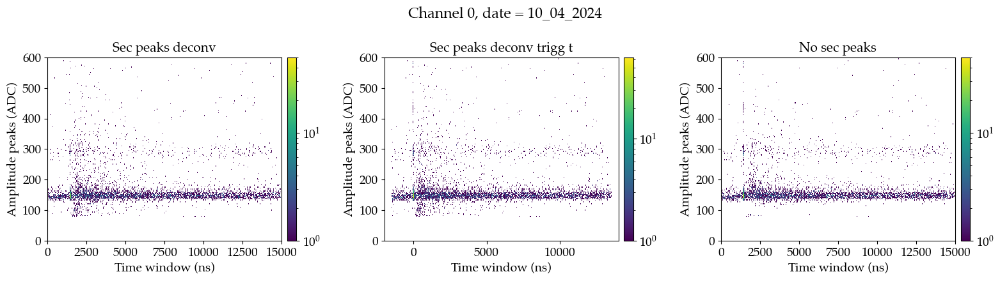

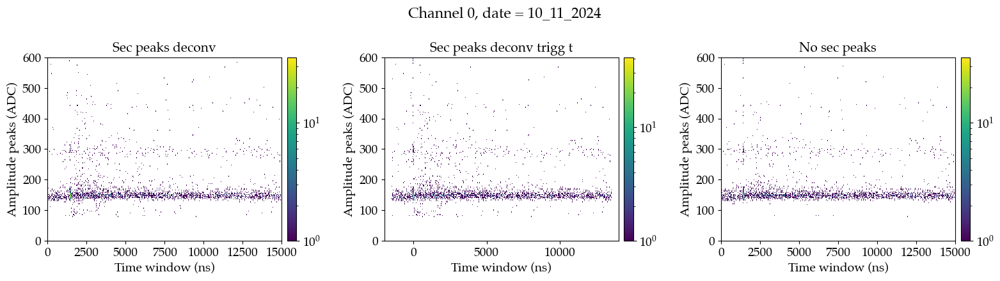

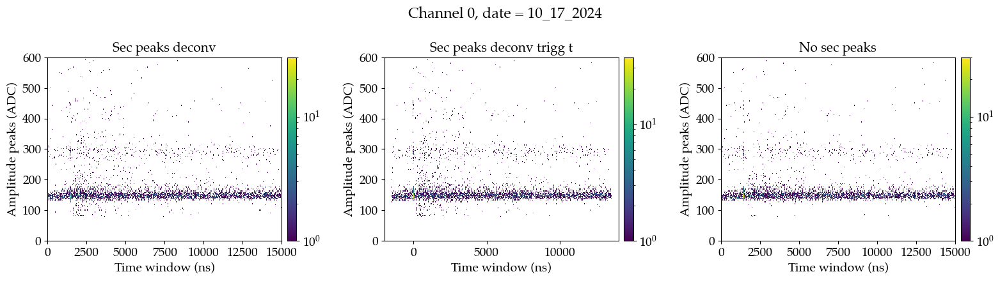

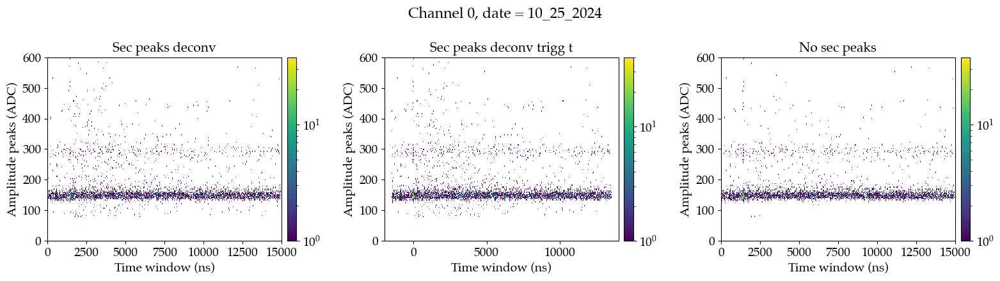

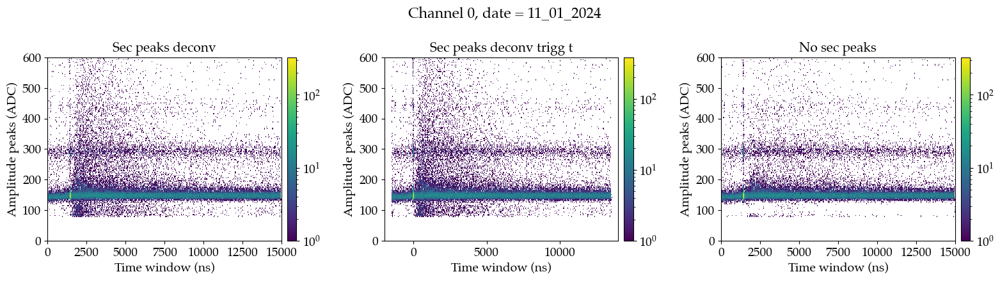

...

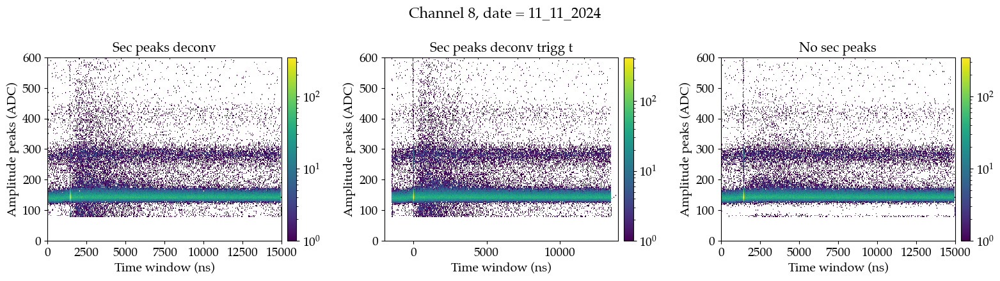

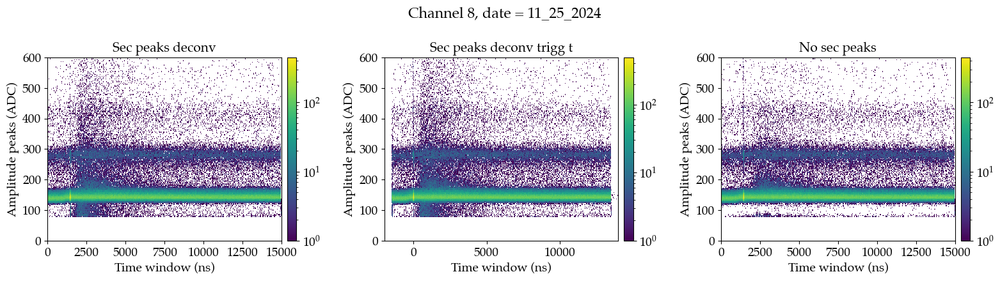

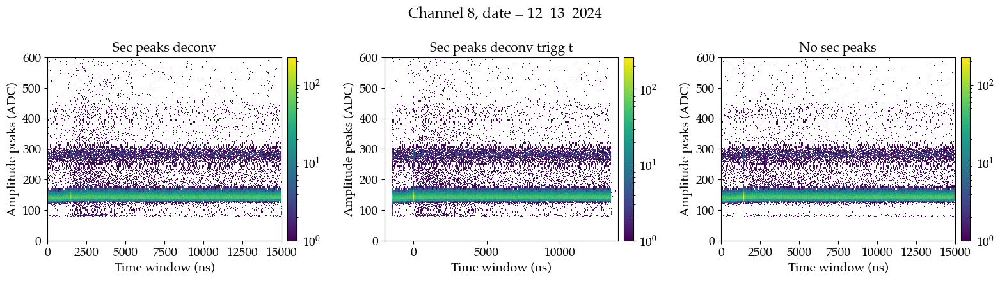

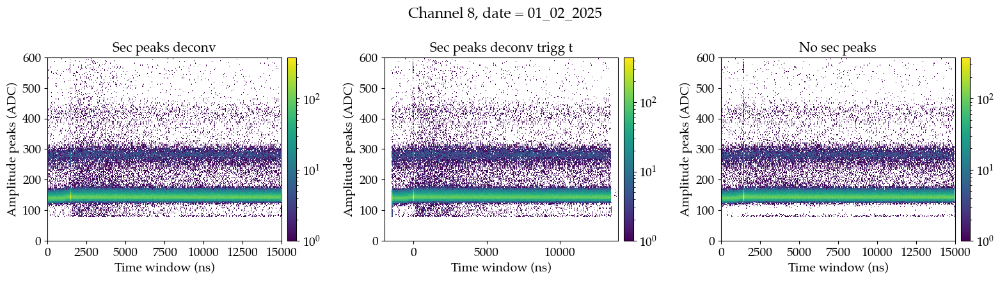

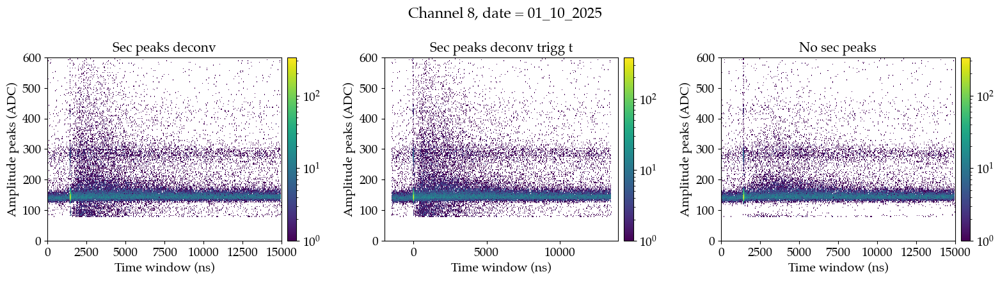

In [52]:
for ch in normal_chs:
    for date in filt_evts_dict.keys():

        fig, axs = plt.subplots(1, 3, figsize=(16, 4.5))

        fig0 = axs[0].hist2d(2*idx_thr         [date][ch], height_sg_d        [date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())
        fig1 = axs[1].hist2d(2*idx_thr_norm    [date][ch], height_sg_d        [date][ch], bins=(500, 200), range=((-2000, 14000), (0, 600)), cmin=1, norm=LogNorm())
        fig2 = axs[2].hist2d(2*idx_sg_d_no_secs[date][ch], height_sg_d_no_secs[date][ch], bins=(500, 200), range=((0, 15000), (0, 600)), cmin=1, norm=LogNorm())

        for j, (ax, title, fig00) in enumerate(zip(axs.flatten(), ['Sec peaks deconv', 'Sec peaks deconv trigg t', 'No sec peaks'], [fig0, fig1, fig2])):
            ax.set_xlabel('Time window (ns)', fontsize=14)
            ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
            ax.set_title(f"{title}", fontsize=15)
            fig.colorbar(fig00[3], ax=ax, pad=0.02)

        plt.suptitle(f'Channel {ch}, date = {date}')
        plt.tight_layout()
        plt.show()


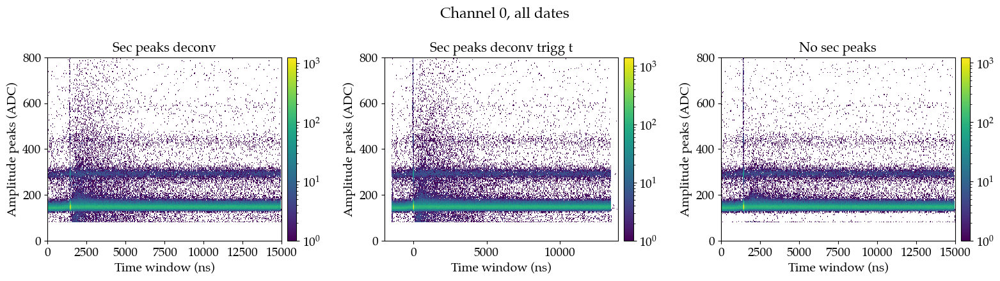

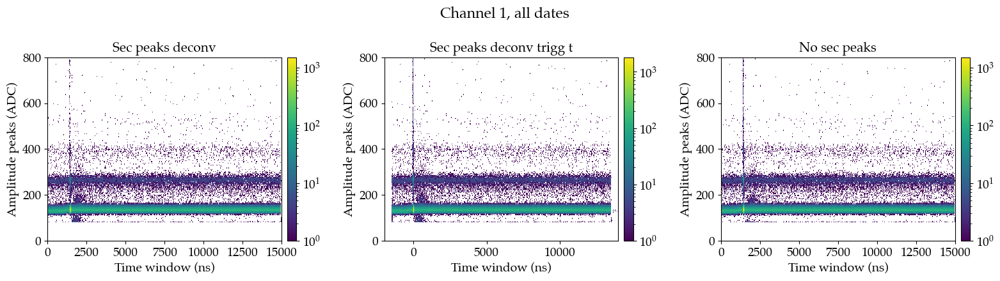

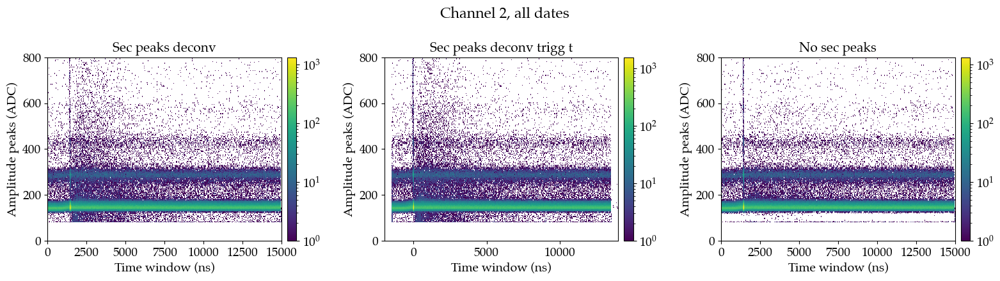

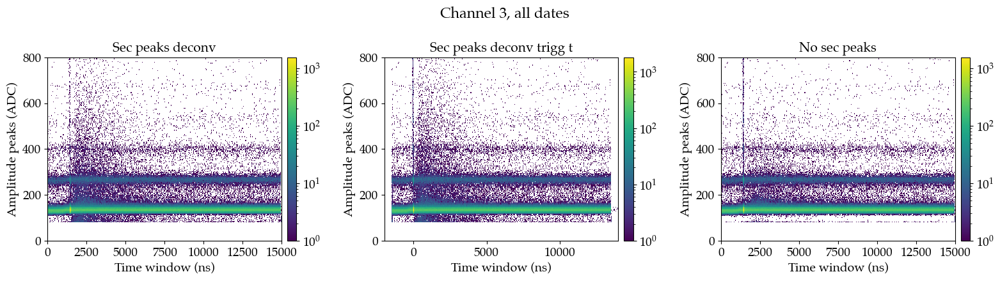

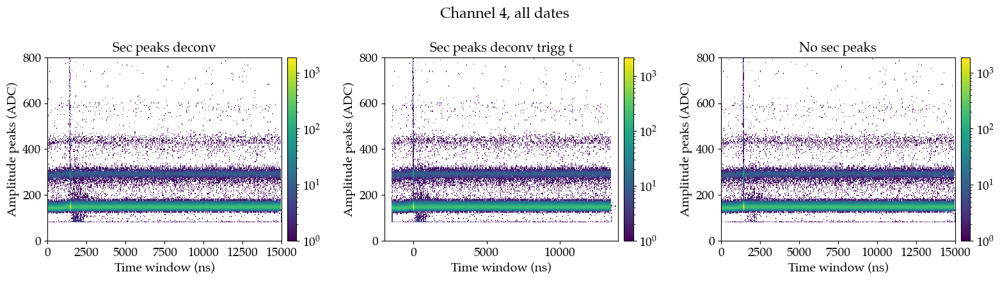

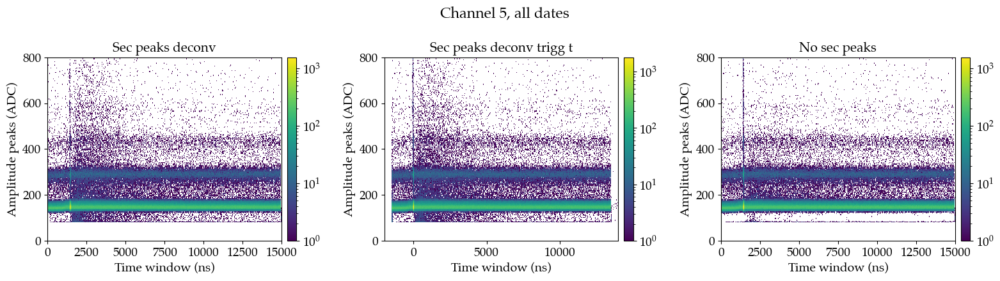

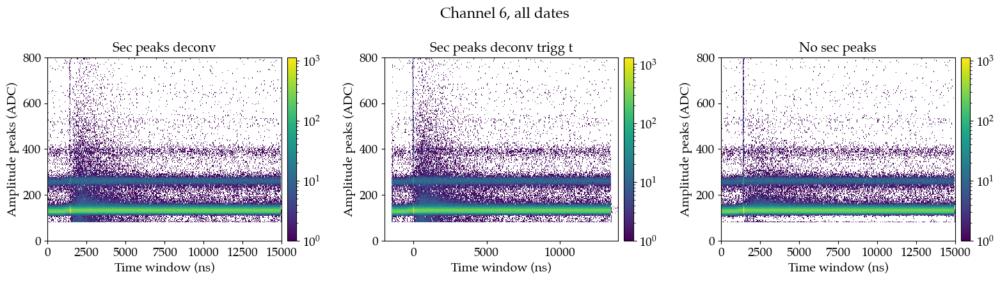

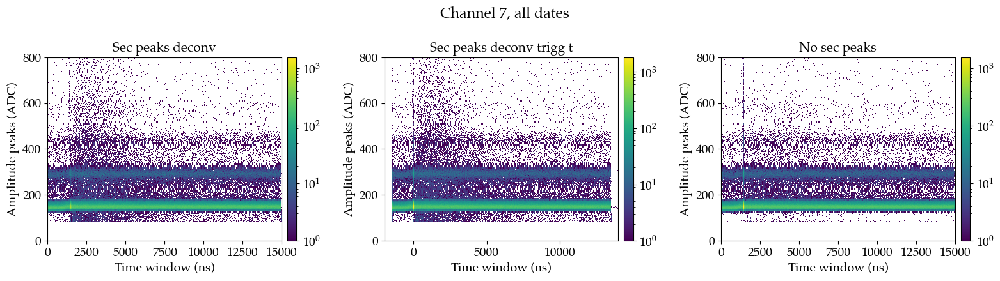

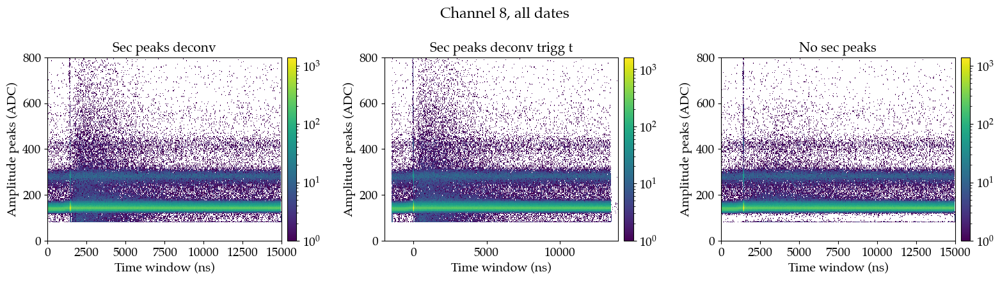

In [64]:
sel_dates = [date for date in idx_thr.keys() if not date.startswith('11')]

for ch in normal_chs:

    fig, axs = plt.subplots(1, 3, figsize=(16, 4.5))
    
    idxs1 = 2*np.concatenate(([idx_thr         [date][ch] for date in sel_dates]))
    idxs2 = 2*np.concatenate(([idx_thr_norm    [date][ch] for date in sel_dates]))
    idxs3 = 2*np.concatenate(([idx_sg_d_no_secs[date][ch] for date in sel_dates]))
    
    vals1 = np.concatenate(([height_sg_d        [date][ch] for date in sel_dates]))
    vals2 = np.concatenate(([height_sg_d_no_secs[date][ch] for date in sel_dates]))

    fig0 = axs[0].hist2d(idxs1, vals1, bins=(500, 200), range=((0, 15000),     (0, 800)), cmin=1, norm=LogNorm())
    fig1 = axs[1].hist2d(idxs2, vals1, bins=(500, 200), range=((-2000, 14000), (0, 800)), cmin=1, norm=LogNorm())
    fig2 = axs[2].hist2d(idxs3, vals2, bins=(500, 200), range=((0, 15000),     (0, 800)), cmin=1, norm=LogNorm())

    for j, (ax, title, fig00) in enumerate(zip(axs.flatten(), ['Sec peaks deconv', 'Sec peaks deconv trigg t', 'No sec peaks'], [fig0, fig1, fig2])):
        ax.set_xlabel('Time window (ns)', fontsize=14)
        ax.set_ylabel('Amplitude peaks (ADC)', fontsize=14)
        ax.set_title(f"{title}", fontsize=15)
        fig.colorbar(fig00[3], ax=ax, pad=0.02)

    plt.suptitle(f'Channel {ch}, all dates')
    plt.tight_layout()
    plt.show()


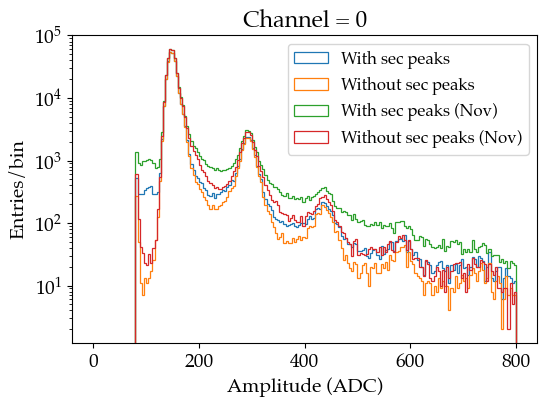

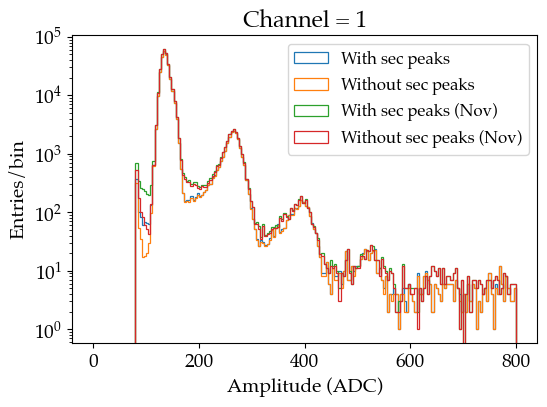

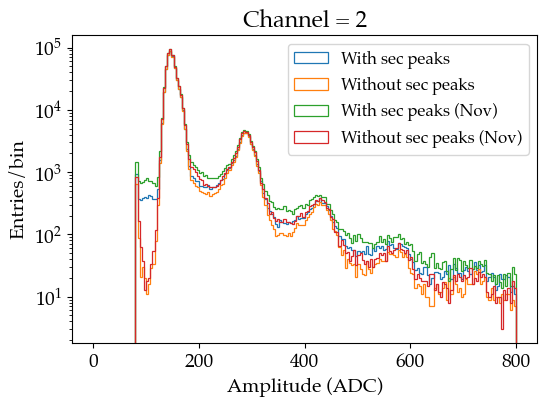

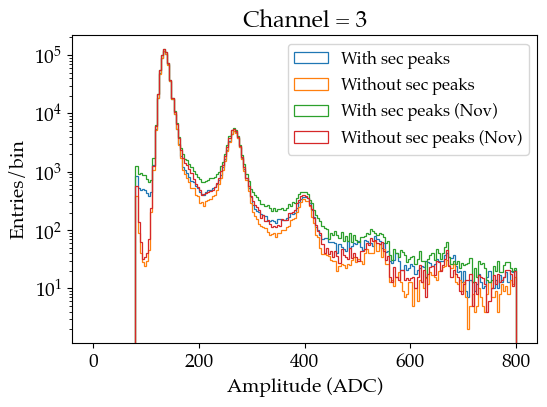

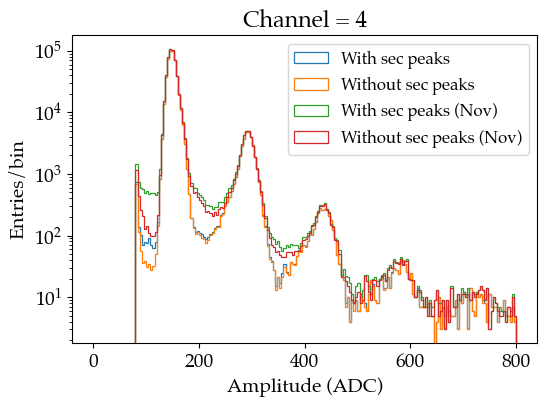

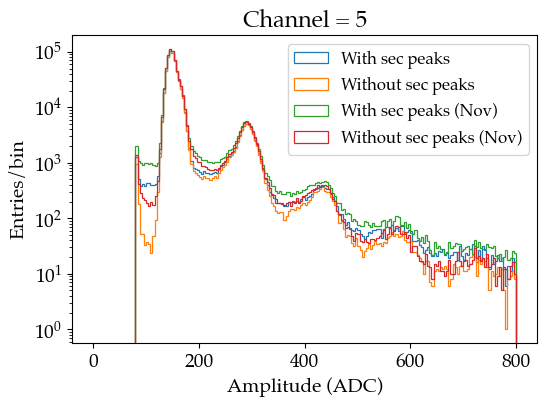

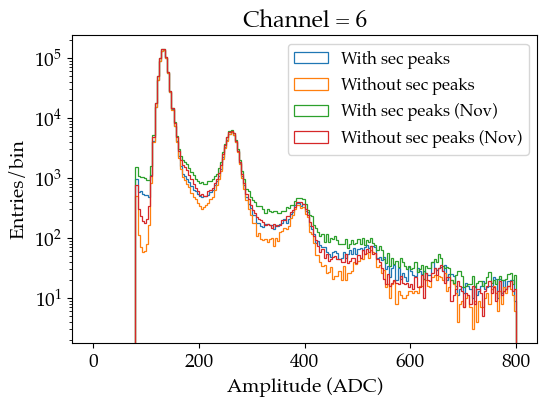

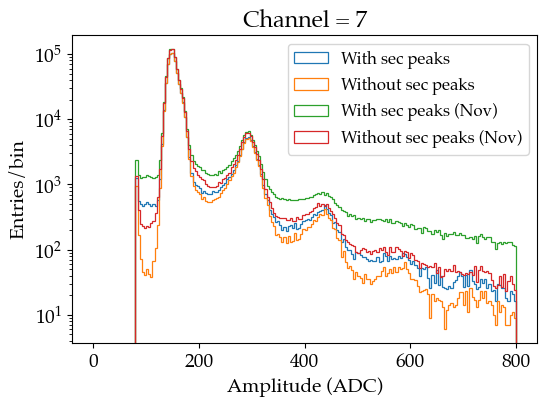

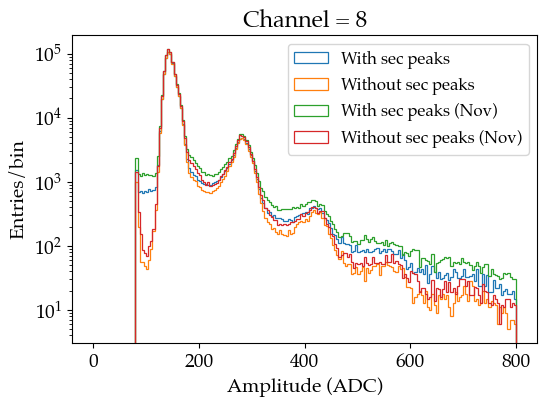

In [75]:
sel_dates  = [date for date in idx_thr.keys() if not date.startswith('11')]
sel_dates2 = [date for date in idx_thr.keys() if     date.startswith('11')]

for ch in normal_chs:

    plt.figure(figsize=(6, 4))
    
    vals1 = np.concatenate(([height_sg_d        [date][ch] for date in sel_dates]))
    vals2 = np.concatenate(([height_sg_d_no_secs[date][ch] for date in sel_dates]))
    vals3 = np.concatenate(([height_sg_d        [date][ch] for date in sel_dates2]))
    vals4 = np.concatenate(([height_sg_d_no_secs[date][ch] for date in sel_dates2]))

    plt.hist(vals1, bins=200, range=(0, 800), log=True, histtype='step', lw=0.9, label='With sec peaks')
    plt.hist(vals2, bins=200, range=(0, 800), log=True, histtype='step', lw=0.9, label='Without sec peaks')
    plt.hist(vals3, bins=200, range=(0, 800), log=True, histtype='step', lw=0.9, label='With sec peaks (Nov)')
    plt.hist(vals4, bins=200, range=(0, 800), log=True, histtype='step', lw=0.9, label='Without sec peaks (Nov)')
    plt.title(f'Channel = {ch}')
    plt.xlabel('Amplitude (ADC)')
    plt.ylabel('Entries/bin')
    plt.legend(fontsize=12)
    plt.show()


## Remove events before trigger and high light events

#### Try with times normalized by the trigger time and with the heights deconvolved with sec peaks

In [ ]:
idx_peak_thr_pretrigg_and_hl_cut       = {}
h_peak_sg_d_pretrigg_and_hl_cut        = {}
num_evts_ch_pretrigg_and_hl_cut        = {}
idx_peak_thr_trigg_pretrigg_and_hl_cut = {}
h_peak_sg_d_trigg_pretrigg_and_hl_cut  = {}
num_evts_ch_trigg_pretrigg_and_hl_cut  = {}

print(len(filt_files))
for ifile,filename in enumerate(filt_files):
    if ifile%20==0:
        print(ifile)
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)

    #print(date, fnum)
    for ch in normal_chs:
        idx_peaks_ch_after_cut    = []
        height_peaks_ch_after_cut = []
        num_evts                  = 0
        idx_peaks_ch    = d['idx_peaks_thr'].item()[ch] - d['mean_trigg_t_normal_chs'].item()[ch]
        height_peaks_ch = d['height_peaks_sg_deconv_ch_dict'].item()[ch]
        for idxs, vals in zip(idx_peaks_ch, height_peaks_ch):
            if len(idxs)==0:
                continue
            elif np.any(np.array(idxs) < 650):
                continue
            elif np.any(np.array(vals) > 500):
                continue
            else:
                idx_peaks_ch_after_cut   .append(idxs)
                height_peaks_ch_after_cut.append(vals)
                num_evts += 1
                
        if date not in idx_peak_thr_pretrigg_and_hl_cut:
            print(date)
            idx_peak_thr_pretrigg_and_hl_cut[date] = {}
            h_peak_sg_d_pretrigg_and_hl_cut [date] = {}
            num_evts_ch_pretrigg_and_hl_cut [date] = {}

        if ch not in idx_peak_thr_pretrigg_and_hl_cut[date]:
            try:
                idx_peak_thr_pretrigg_and_hl_cut[date][ch] = np.concatenate(idx_peaks_ch_after_cut)
                h_peak_sg_d_pretrigg_and_hl_cut [date][ch] = np.concatenate(height_peaks_ch_after_cut)
                num_evts_ch_pretrigg_and_hl_cut [date][ch] = np.array([num_evts])
            except Exception as e:
                print(e)
                continue
        else:
            try:
                idx_peak_thr_pretrigg_and_hl_cut[date][ch] = np.concatenate((idx_peak_thr_pretrigg_and_hl_cut[date][ch], np.concatenate(idx_peaks_ch_after_cut)))
                h_peak_sg_d_pretrigg_and_hl_cut [date][ch] = np.concatenate((h_peak_sg_d_pretrigg_and_hl_cut [date][ch], np.concatenate(height_peaks_ch_after_cut)))
                num_evts_ch_pretrigg_and_hl_cut [date][ch] = np.concatenate((num_evts_ch_pretrigg_and_hl_cut [date][ch], np.array([num_evts])))
            except Exception as e:
                print(e)
                continue
        
        
    for ch in trigger_chs:
        idx_peaks_ch_after_cut    = []
        height_peaks_ch_after_cut = []
        num_evts                  = 0
        idx_peaks_ch    = d['idx_peaks_thr_ch_trigg_dict']         .item()[ch]
        height_peaks_ch = d['height_peaks_sg_deconv_ch_trigg_dict'].item()[ch]
        for idxs, vals in zip(idx_peaks_ch, height_peaks_ch):
            if len(idxs)==0:
                continue
            elif np.any(np.array(idxs) < 650):
                continue
            else:
                idx_peaks_ch_after_cut   .append(idxs)
                height_peaks_ch_after_cut.append(vals)
                num_evts += 1
                
        if date not in idx_peak_thr_trigg_pretrigg_and_hl_cut:
            idx_peak_thr_trigg_pretrigg_and_hl_cut[date] = {}
            h_peak_sg_d_trigg_pretrigg_and_hl_cut [date] = {}
            num_evts_ch_trigg_pretrigg_and_hl_cut [date] = {}
    
        if ch not in idx_peak_thr_trigg_pretrigg_and_hl_cut[date]:
            try:
                idx_peak_thr_trigg_pretrigg_and_hl_cut[date][ch] = np.concatenate(idx_peaks_ch_after_cut)
                h_peak_sg_d_trigg_pretrigg_and_hl_cut [date][ch] = np.concatenate(height_peaks_ch_after_cut)
                num_evts_ch_trigg_pretrigg_and_hl_cut [date][ch] = np.array([num_evts])
            except Exception as e:
                print(e)
                continue
        else:
            try:
                idx_peak_thr_trigg_pretrigg_and_hl_cut[date][ch] = np.concatenate((idx_peak_thr_trigg_pretrigg_and_hl_cut[date][ch], np.concatenate(idx_peaks_ch_after_cut)))
                h_peak_sg_d_trigg_pretrigg_and_hl_cut [date][ch] = np.concatenate((h_peak_sg_d_trigg_pretrigg_and_hl_cut [date][ch], np.concatenate(height_peaks_ch_after_cut)))
                num_evts_ch_trigg_pretrigg_and_hl_cut [date][ch] = np.concatenate((num_evts_ch_trigg_pretrigg_and_hl_cut [date][ch], np.array([num_evts])))
            except Exception as e:
                print(e)
                continue
                
                
                
                
                
idx_thr_norm_pt_hl       = {}
height_sg_d_pt_hl        = {}
num_evts_pt_hl           = {}
idx_thr_norm_trigg_pt_hl = {}
height_sg_d_trigg_pt_hl  = {}
num_evts_trigg_pt_hl     = {}


for filename in sorted_files:
    d          = np.load(filename, allow_pickle=True)
    date, fnum = extract_date_and_number(filename)
    
    for ch in normal_chs:
        idx_after_cut    = []
        height_after_cut = []
        num_evts         = 0
        idx_peaks_ch    = d['idx_peaks_thr'].item()[ch] - d['mean_trigg_t_normal_chs'].item()[ch]
        height_peaks_ch = d['height_peaks_sg_deconv'].item()[ch]
        for idxs, vals in zip(idx_peaks_ch, height_peaks_ch):
            if len(idxs)==0:
                continue
            elif np.any(np.array(idxs) < 650):
                continue
            elif np.any(np.array(vals) > 1000):
                continue
            else:
                idx_after_cut   .append(idxs)
                height_after_cut.append(vals)
                num_evts += 1
                
        if date not in idx_thr_norm_pt_hl:
            print(date)
            idx_thr_norm_pt_hl[date] = {}
            height_sg_d_pt_hl [date] = {}
            num_evts_pt_hl    [date] = {}

        if ch not in idx_thr_norm_pt_hl[date]:
            try:
                idx_thr_norm_pt_hl[date][ch] = np.concatenate(idx_after_cut)
                height_sg_d_pt_hl [date][ch] = np.concatenate(height_after_cut)
                num_evts_pt_hl    [date][ch] = np.array([num_evts])
            except Exception as e:
                print(e)
                continue
        else:
            try:
                idx_thr_norm_pt_hl[date][ch] = np.concatenate((idx_thr_norm_pt_hl[date][ch], np.concatenate(idx_after_cut)))
                height_sg_d_pt_hl [date][ch] = np.concatenate((height_sg_d_pt_hl [date][ch], np.concatenate(height_after_cut)))
                num_evts_pt_hl    [date][ch] = np.concatenate((num_evts_pt_hl    [date][ch], np.array([num_evts])))
            except Exception as e:
                print(e)
                continue
            
            
            
    